# Assignment1


In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

import os

## Reading Images

210
fg (210, 567, 3)
bg (684, 795, 3)


(-0.5, 794.5, 683.5, -0.5)

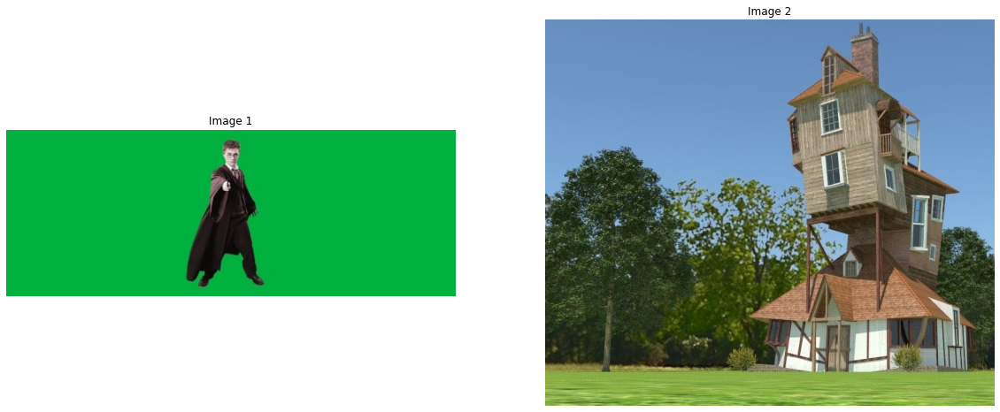

In [2]:
fg = cv2.imread("../images/fg.jpg")
bg = cv2.imread("../images/bg.jpg")
fg = cv2.cvtColor(fg, cv2.COLOR_BGR2RGB)
bg  = cv2.cvtColor(bg, cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(20,20))
height,width,x = fg.shape
print(height)
print("fg " + str(fg.shape))
print("bg " + str(bg.shape))
# Plot the first image
ax = fig.add_subplot(221)
ax.imshow(fg)
ax.set_title('Image 1')
ax.axis("off")

# Plot the second image
ax = fig.add_subplot(222)
ax.imshow(bg)
ax.set_title('Image 2')
ax.axis("off")


### Using the green Screen to show the subject

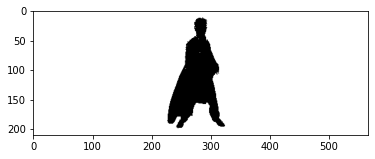

In [3]:
lower_green = np.array([0,100,0])
upper_green = np.array([120,255,100])
mask = cv2.inRange(fg, lower_green, upper_green)
masked_image = np.copy(fg)
masked_image[mask!=0] = [0,0,0]
plt.imshow(mask, cmap='gray')



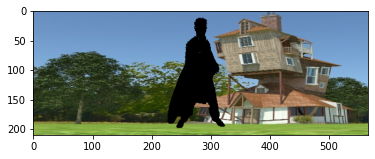

In [4]:
resized_bg = cv2.resize(bg,(width,height))
resized_bg[mask == 0] = [0,0,0]
plt.imshow(resized_bg)

### Adding both images for Result

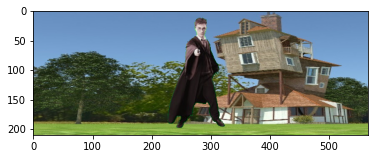

In [5]:
final_image = resized_bg+masked_image
plt.imshow(final_image)

- The main function of green screen is to help in creating a mask, that is an image that knows exactly what part of the image which is to be superimposed on the other is to be used. 

- It makes use of the concept of color thresholds, by isolating areas that lie within a certain range of color, and working with them.

- This helps ignore the background and isolate the main part of the image

In [6]:
!wget -O hog.jpg https://images.ctfassets.net/usf1vwtuqyxm/7EsDSrJhr0pNwUNK8lrUwY/f8d7e5101de6dda8f46c0f94673087a9/HP-Hogwarts-39PHOTOBU17074_PHUP_HP.jpg

--2021-09-20 23:57:51--  https://images.ctfassets.net/usf1vwtuqyxm/7EsDSrJhr0pNwUNK8lrUwY/f8d7e5101de6dda8f46c0f94673087a9/HP-Hogwarts-39PHOTOBU17074_PHUP_HP.jpg
Resolving images.ctfassets.net (images.ctfassets.net)... 99.86.47.85, 99.86.47.74, 99.86.47.104, ...
Connecting to images.ctfassets.net (images.ctfassets.net)|99.86.47.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1329334 (1.3M) [image/jpeg]
Saving to: ‘hog.jpg’

hog.jpg             100%[===================>]   1.27M  7.54MB/s    in 0.2s    

2021-09-20 23:57:51 (7.54 MB/s) - ‘hog.jpg’ saved [1329334/1329334]



In [7]:
!wget -O jett.jpg https://i.ytimg.com/vi/RhkPhTWPniE/mqdefault.jpg

--2021-09-20 23:57:51--  https://i.ytimg.com/vi/RhkPhTWPniE/mqdefault.jpg
Resolving i.ytimg.com (i.ytimg.com)... 142.250.194.54, 142.250.194.86, 142.250.194.118, ...
Connecting to i.ytimg.com (i.ytimg.com)|142.250.194.54|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3898 (3.8K) [image/jpeg]
Saving to: ‘jett.jpg’

jett.jpg            100%[===================>]   3.81K  --.-KB/s    in 0s      

2021-09-20 23:57:51 (24.7 MB/s) - ‘jett.jpg’ saved [3898/3898]



### Harry Puttar in Hogwarts

(1733, 2000, 3)


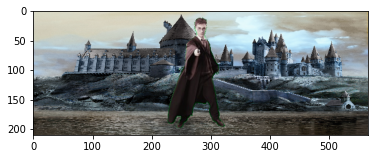

In [8]:
hogwarts= cv2.imread('hog.jpg')
print(hogwarts.shape)
resized_hog = cv2.resize(hogwarts,(width,height))
# resized_hog = hogwarts
resized_hog[mask == 0] = [0,0,0]
final = resized_hog+masked_image
plt.imshow(final)

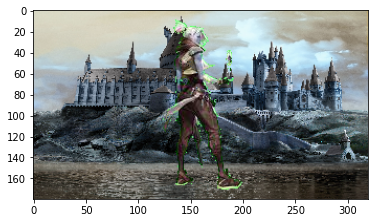

In [9]:
jett  = cv2.imread('jett.jpg')
height,width,x = jett.shape
# resized_jett = cv2.resize(jett,(width,height))
mask = cv2.inRange(jett, lower_green, upper_green)
masked_image = np.copy(jett)
masked_image[mask!=0] = [0,0,0]
resized_hog = cv2.resize(hogwarts,(width,height))
resized_hog[mask == 0] = [0,0,0]
final = resized_hog+masked_image
plt.imshow(final)

#### Question 2
Since each pixel in a image consists of 3 bytes (R,G,B).</br>
  Hence Total memory consumed by one image would be 720 * 576 * 3  bytes</br>
   Memory Available = 2 GB = 2 * 1024 * 1024 * 1024 bytes = 2147483648 bytes</br>
Total Images would be approximately 1726</br>

## 2.Colin's Storage Issues

Let the each side of image be of X pixels.
<br> Assuming the images to be RGB.Each pixel would take up 3 bytes.<br>
Therefore total size of image with side x would be $3*X^{2}$.<br>
For 200 images total size would be $ 600 *X^{2}$.<br>
Since total size is 500 MB or 500 * 2^20.<br> Hence $$ X^{2} = \frac{5}{6}*2^{20}$$
$$X  = 934 \ pixels $$



## 3.Identifying the Basilisk


The given focal length is f = 43.5cm,distance between camera and basilisk is d = 240m.<br>
Let the length of image formed on screen be $h'$ ,height of object be h and distance between lens and screen be v.<br>
The target should cover atleast 390 pixels in height.
The picture taken is 1024x1024 in dimensions and is formed on a 10mmx10mm screen,so height of image formed is $h' = \frac{390}{1024}*10mm$ $$ h' = 3.81mm$$<br>
By magnification formula $m = -\frac{v}{u} = \frac{h'}{h}$
As image is inverted the negatives cancel out.<br>
By lens formula , $$\frac{1}{v} = \frac{1}{f} - \frac{1}{d}$$
Putting it in the magnification formula.
$$ h = h'(\frac{d}{f}-1) = 2.1m$$
Therefore height of basilisk is 2.1 m.

## 4.  Draco Strikes again

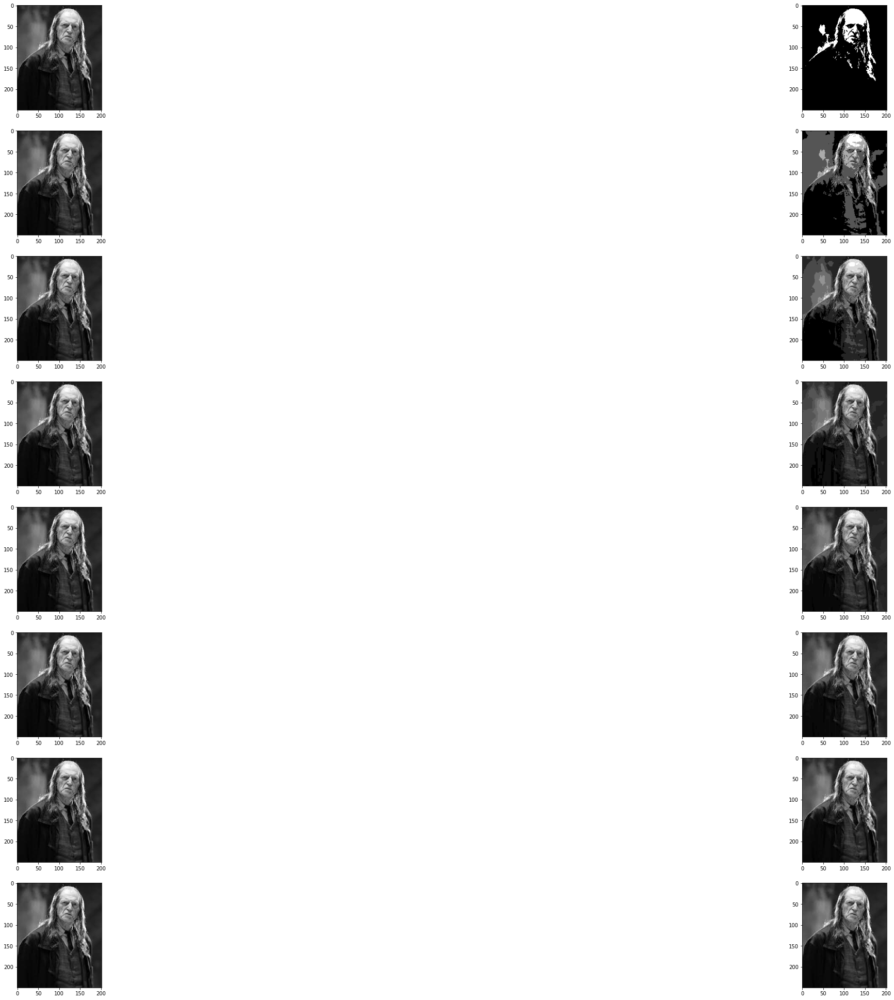

In [10]:
rows,columns=8,2
index=1
fig = plt.figure(figsize=(50, 35))
def takeClosest(num,collection):
   return min(collection,key=lambda x:abs(x-num))
def bitQuantizeImage(im,k):
    x=range(256)
    l = np.array_split(np.array(x),(2**k)-1)
    temp , lst=[],[]
    lim=0
    temp.append(0)
    for x in l:
        temp.append(x[len(x)-1])
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            im[i][j]=takeClosest(im[i][j],temp)
    return im
filch=cv2.imread('../images/filch.jpg',0)
for i in range (1,9):
    temp=bitQuantizeImage(np.copy(filch),i)
    fig.add_subplot(rows, columns, index)
    plt.imshow(filch, cmap="gray")
    fig.add_subplot(rows, columns, index+1)
    plt.imshow(temp, cmap="gray")
    index+=2

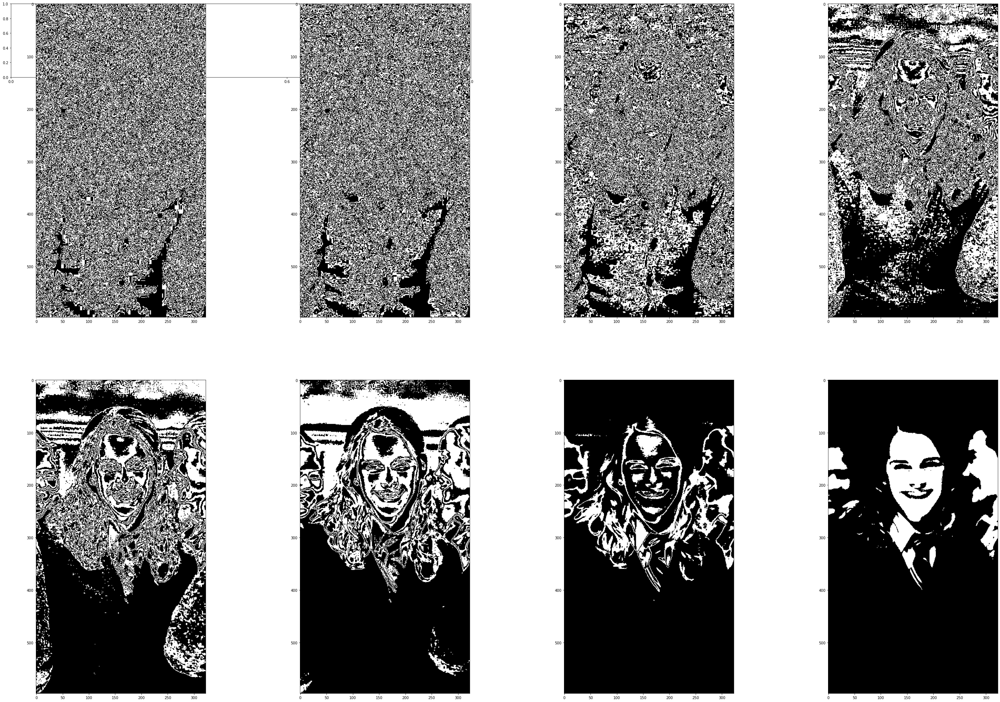

In [11]:
#4-3
def precal(img):
    lst = []
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            lst.append(np.binary_repr(img[i][j] ,width=8)) 
    return lst

def bitslice(img,index):
    bits = 2**(index-1)
    temp = (np.array([int(i[8-index]) for i in lst],dtype = np.uint8) * bits).reshape(img.shape[0],img.shape[1])
    return temp

hermoine=cv2.imread('../images/hermoine.jpg',0)
fig = plt.figure(figsize=(50, 35))

fig.add_subplot(rows, columns, 1)
lst = precal(np.copy(hermoine))
for i in range(1,9):
    fig.add_subplot(2, 4, i)
    plt.imshow(bitslice(np.copy(hermoine),i), cmap="gray")


In [2]:
#Q4 4
#Roll Number = 2019101061%5 = 1##person ron
ron_corrupt = cv2.imread('../images/ron_corrupt.jpg')
fig = plt.figure(figsize=(50, 35))
fig.add_subplot(2, 2, 1)
plt.imshow(ron_corrupt)

NameError: name 'cv2' is not defined

##  5.Snape and order of Phoenix

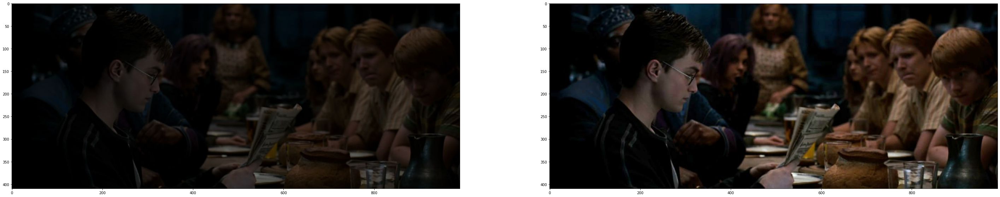

In [13]:
phoenix = cv2.imread('../images/phoenix-bad.jpg')
phoenix = cv2.cvtColor(phoenix, cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize = (50,35))
####################################################################################
def linContrastStretching(image,a,b):
    to_reshape=np.copy(image)
    to_reshape=np.transpose(to_reshape,(2,0,1)).reshape(3,-1)

    low,high=[0,0,0],[0,0,0]
    
    for i in range(3):
        low[i]=np.amin(to_reshape[i])
        high[i]=np.amax(to_reshape[i])

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            temp=image[i][j]
            for x in range(3):
                temp[x]=round((temp[x]-low[x])*((b-a)/(high[x]-low[x]))+a)
            image[i][j]=temp
            
#             
    to_reshape=np.copy(image)
    to_reshape=np.transpose(to_reshape,(2,0,1)).reshape(3,-1)
    return image
####################################################################################
contrast=linContrastStretching(np.copy(phoenix),0,255)
fig.add_subplot(2, 2, 1)
plt.imshow(phoenix)
fig.add_subplot(2, 2, 2)
plt.imshow(contrast)

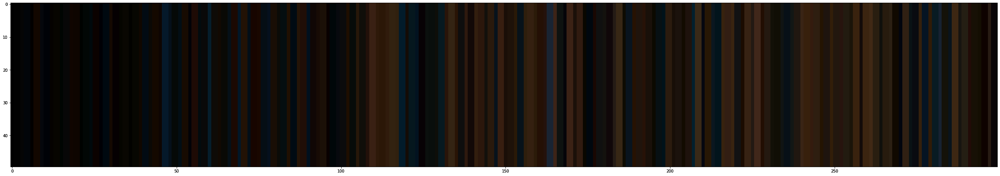

In [24]:
def palette(clusters):
    width=300
    palette = np.zeros((50, width, 3), np.uint8)
    steps = width/clusters.shape[0]
    for idx, centers in enumerate(clusters): 
        palette[:, int(idx*steps):(int((idx+1)*steps)), :] = centers
    return palette  

def getBar(image,k,index):
    image=np.reshape(image,(-1,3))
    unique_elements, frequency = np.unique(image,axis=0, return_counts=True)
    sorted_indexes = np.argsort(frequency)[::-1]
    sorted_by_freq = unique_elements[sorted_indexes]

    bar=palette(sorted_by_freq[:k])
    fig.add_subplot(2, 2, 1)
    plt.imshow(bar)


fig = plt.figure(figsize=(100, 85))
getBar(phoenix,200,1)
getBar(contrast,200,2)

The original image has a intensity of all colors of atmost 110.By scaling images to a larger range of 0-255,some darker colors will convert to lighter colors<br>
Now the image is increased in contrast.<br>
Let the range of stretching be from a to b and our intensity range be c and d.Thus each pixel is changed by $output = (input-c)*\frac{b-a}{d-c}+a$<br>
After spreading the pixels among more lighter colors, lighter colors become more frequent and that is reflected in the colorbar


## 6. Hermoinie and Linear Transforms

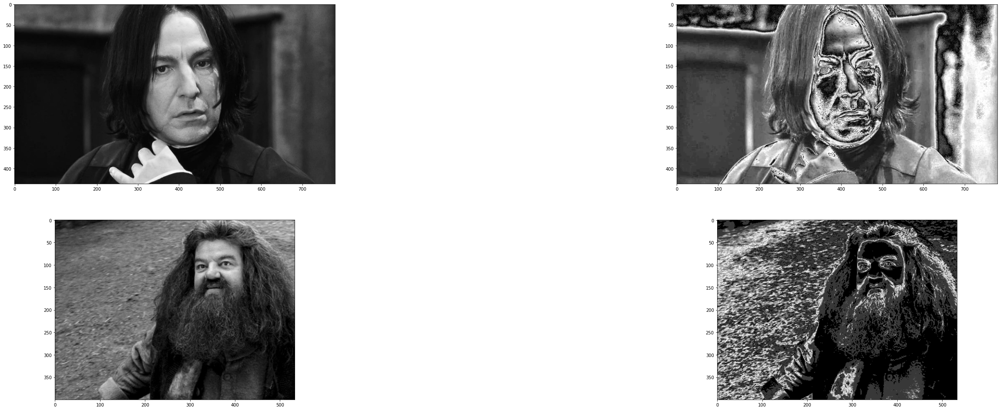

In [15]:
#6-1
def piecewiseLinTransform(image,intervals):
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            x=image[i][j]
            for interval in intervals:
                if x >= interval[0] and x<=interval[1]:
                    x=interval[3]+interval[2]*x
                    break
            image[i][j]=x
    return image
#6-2
snape = cv2.imread('../images/snape1.jpg',0)
hagrid=cv2.imread('../images/hagrid.jpg',0)
l = 256

interval1 = [0,2*l/9,4.5,0]
interval2 = [2*l/9,3*l/9,-9,765]
interval3 = [3*l/9,5*l/9,4.5,-382.5]
interval4 = [5*l/9,6*l/9,-9,1530]
interval5 = [6*l/9,8*l/9,4.5,-765]
interval6 = [8*l/9,l,-9,2295]
intervals=[interval1,interval2,interval3,interval4,interval5,interval6]
fig = plt.figure(figsize=(50, 35))
rows,columns=4,2
new_image=piecewiseLinTransform(np.copy(snape),intervals)
fig.add_subplot(rows, columns, 1)
plt.imshow(snape,cmap='gray')
fig.add_subplot(rows, columns, 2)
plt.imshow(new_image,cmap='gray')
##########
l=256/9
interval1 = [0,l,0,0]
interval2 = [l,2*l,0,2*l]
interval3 = [2*l,3*l,7,-12*l]
interval4 = [3*l,4*l,-7,30]
interval5 = [4*l,5*l,0,2*l]
interval6 = [5*l,9*l,0,0]

intervals=[interval1,interval2,interval3,interval4,interval5,interval6]
new_image=piecewiseLinTransform(np.copy(hagrid),intervals)
fig.add_subplot(rows, columns, 3)
plt.imshow(hagrid,cmap='gray')
fig.add_subplot(rows, columns, 4)
plt.imshow(new_image,cmap='gray')


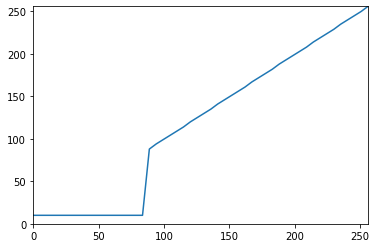

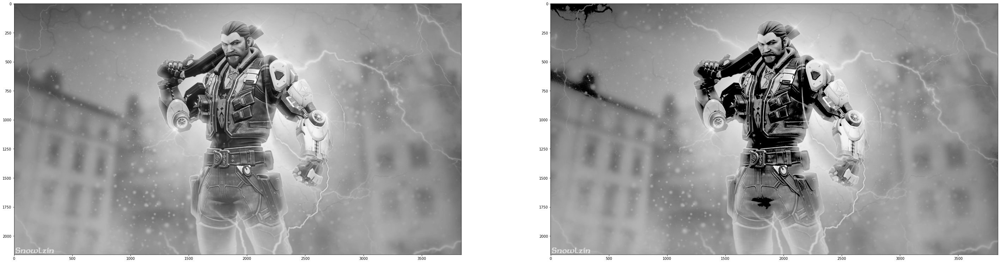

In [16]:
def fun(x):
    if x < 256/3:
        return 10
    else:
        return x

vfun = np.vectorize(fun)

x = np.linspace(0,256)
y = vfun(x)

plt.axis([0,256,0,256])
plt.plot(x,y,'-')
plt.show()
#####################################################################################################
breach=cv2.imread('../images/breach.jpg',0)
l=256/9
intervals=[[0,256/3,0,0],[256/3,256,1,0]]
fig = plt.figure(figsize=(50, 35))
new_image=piecewiseLinTransform(np.copy(breach),intervals)
fig.add_subplot(2, 2, 1)
plt.imshow(breach,cmap='gray')
fig.add_subplot(2, 2, 2)
plt.imshow(new_image,cmap='gray')

### Steps used:
 - From the graph used as basis for transforming gray level of the image,we can identify start and end points of intervals.
 - Using the two points ,slope of the line is calculated in the form of y = mx +c.
 -Then the list of interval details is made which represent line in the graph
 - These intervals are passed into the function with the image which changes the pixel of the image belonging to corresponding interval.
 -Thee linear transformation is then applied on it

## 7 .  The Marauder's map

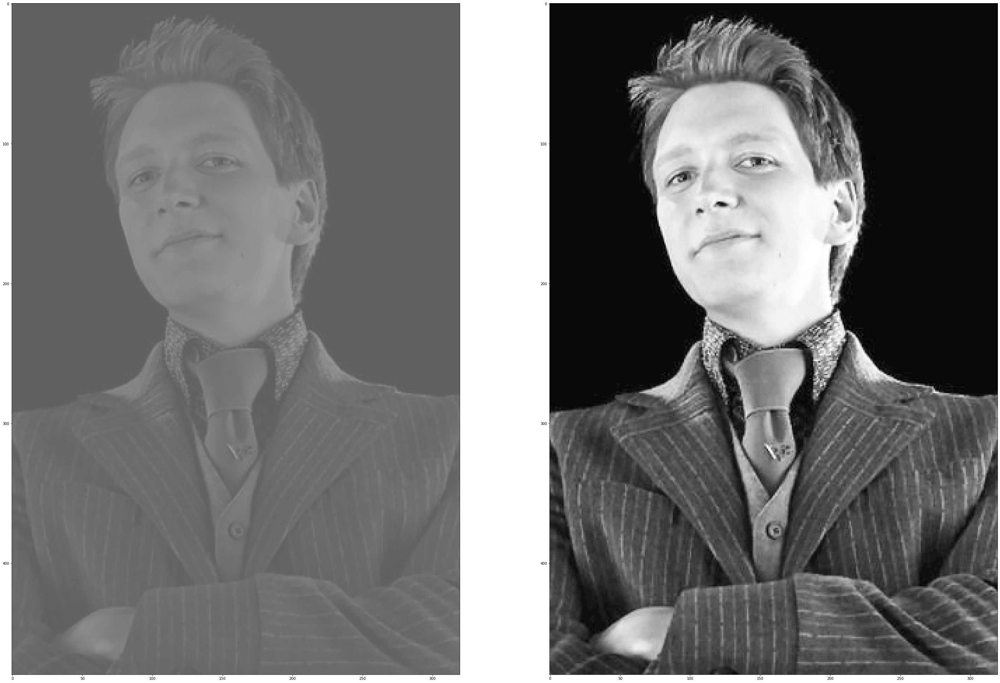

In [8]:
def histEqualization(image):
    
    hist=[]
    for i in range(256):
        hist.append(0)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            hist[image[i][j]]+=1

    pixels={}
    # print(hist)
    img_size=image.shape[0]*image.shape[1]
    hist[0]/=img_size

    for i in range(1,256):
        hist[i]/=img_size
        hist[i]+=hist[i-1]
        pixels[i]=round(hist[i]*255)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            image[i][j]=pixels[image[i][j]]
    return image,pixels

#########################################################
image = cv2.imread('../images/fred.jpeg')
image_cop= cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
new_image,junk=histEqualization(np.copy(image_cop))
fig = plt.figure(figsize=(50, 35))
fig.add_subplot(1, 2, 1)
plt.imshow(image)
fig.add_subplot(1, 2, 2)
plt.imshow(new_image,cmap='gray')



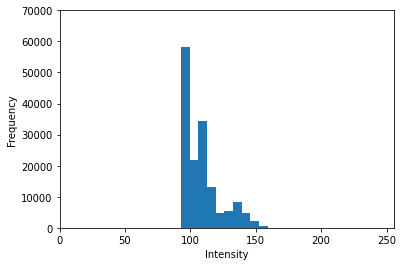

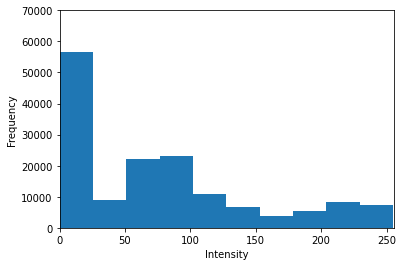

In [9]:
def make_histogram(image,val):
    weightList=image.flatten()
    weightList.sort()
    plt.hist(weightList, bins=10)
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    plt.axis([0, 256,0,val]) 
    plt.show()

val = 70000
make_histogram(image_cop,val)
make_histogram(new_image,val)

The intensity of pixels is mainly between 100-150 range and limits the tones of color.<br>
The second picture makes more distributed pixels which increases contrast.

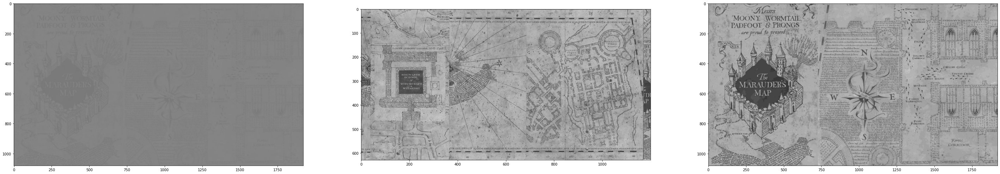

<Figure size 432x288 with 0 Axes>

In [10]:
#4-3
def histMatch(image,reference):
    
    temp,map1=histEqualization(np.copy(image))
    temp,map2=histEqualization(np.copy(reference))
    new_image=np.copy(image)

    for i in map1:
        map1[i]=int(min(map2.items(), key=lambda x: abs(map1[i] - x[1]))[0])

    for i in range(0,new_image.shape[0]):
        for j in range(0,new_image.shape[1]):
            new_image[i][j]=map1[new_image[i][j]]

    return new_image
############################################################
map=cv2.imread('../images/map.jpeg')
fig = plt.figure(figsize=(50, 35))
fig.add_subplot(3, 3, 1)
plt.imshow(map)
image=cv2.cvtColor(map,cv2.COLOR_BGR2GRAY)
reference=cv2.imread('../images/map-reference.jpeg',0)
new_image=histMatch(image,reference)
fig.add_subplot(3, 3, 2)
plt.imshow(reference,cmap='gray')
fig.add_subplot(3, 3, 3)
plt.imshow(new_image,cmap='gray')
plt.figure().clear()


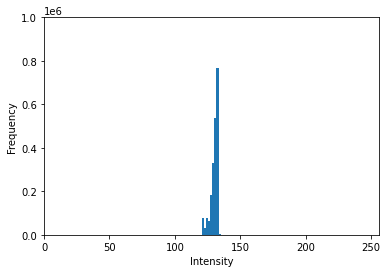

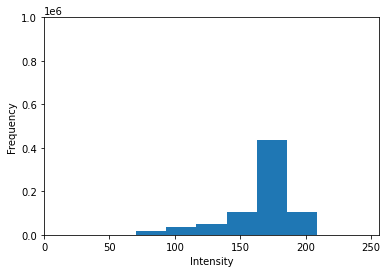

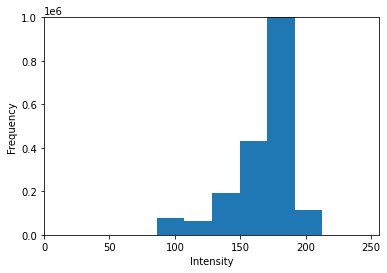

In [11]:
###########################################################
val = 1000000
make_histogram(image,val)
make_histogram(reference,val)
make_histogram(new_image,val)

##  8. The Seven Hocruxes

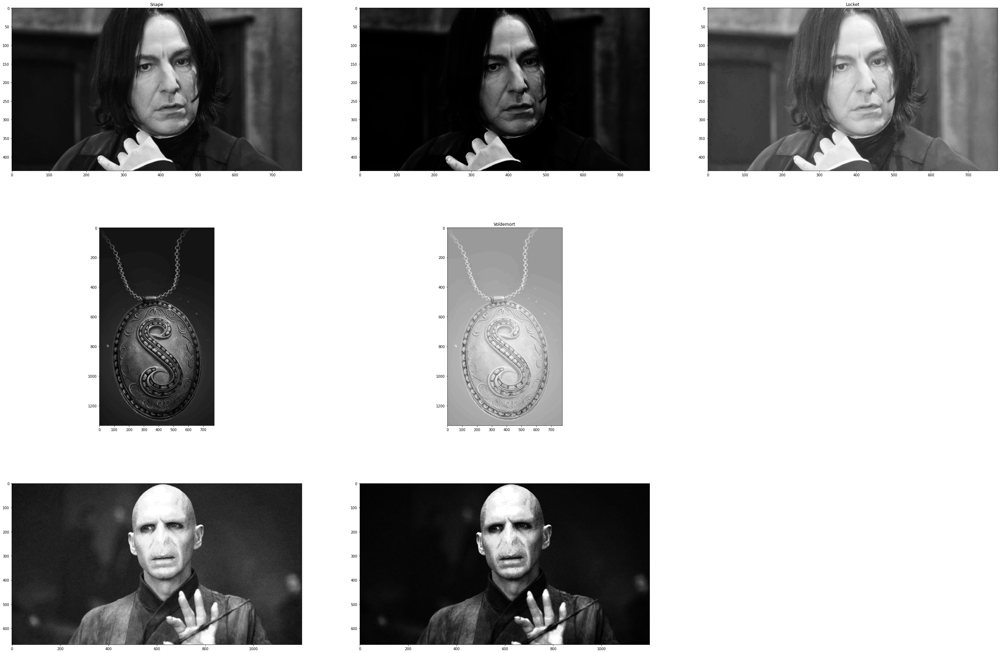

In [21]:
def gamma_transform(image,gamma):
    image= np.array(255*(image/255)**gamma,dtype='uint8')
    return image
snape = cv2.imread("../images/snape1.jpg",0)
fig = plt.figure(figsize=(50, 35))

trial1=gamma_transform(np.copy(snape),2)
trial2=gamma_transform(np.copy(snape),0.5)

fig.add_subplot(3, 3, 1)
plt.title("Snape")
plt.imshow(snape,cmap='gray')
fig.add_subplot(3,3, 2)
plt.imshow(trial1,cmap='gray')
fig.add_subplot(3,3, 3)
plt.imshow(trial2,cmap='gray')
#####################################################################
plt.title("Locket")
locket=cv2.imread('../images/locket.jpeg',0)
locket1=gamma_transform(np.copy(locket),0.20)
fig.add_subplot(3,3, 4)
plt.imshow(locket,cmap='gray')
fig.add_subplot(3,3,5)
plt.imshow(locket1,cmap='gray')
#####################################################################
plt.title("Voldemort")
voldy=cv2.imread('../images/voldemort.jpeg',0)
voldy1=gamma_transform(np.copy(voldy),2)
fig.add_subplot(3, 3, 7)
plt.imshow(voldy,cmap='gray')
fig.add_subplot(3, 3, 8)
plt.imshow(voldy1,cmap='gray')

-Using Curves with y<1 the dark values are expanded to wider range of lighter values.Similarly with y>1 lighter values are mapped to darker one.<br>
-Basically γ <1 makes image brighter, whereas >1 makes it darker.

## Question 9

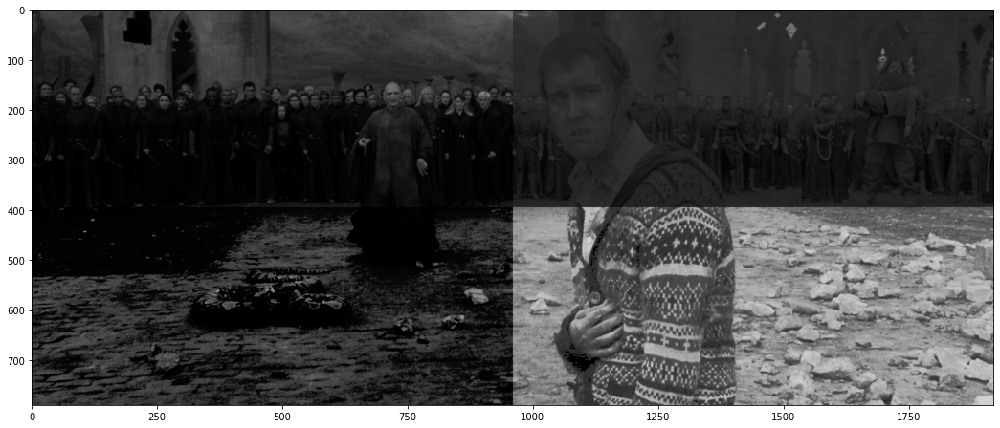

In [22]:
#given
nev1=cv2.imread('../images/neville1.jpg')
nev2=cv2.imread('../images/neville2.jpg')
nev3=cv2.imread('../images/neville3.jpg')
nev4=cv2.imread('../images/neville4.jpg')
total = cv2.vconcat([cv2.hconcat([nev1,nev3]),cv2.hconcat([nev2,nev4])])
fig = plt.figure(figsize=(40, 35))
fig.add_subplot(4, 2, 1)
plt.imshow(total)

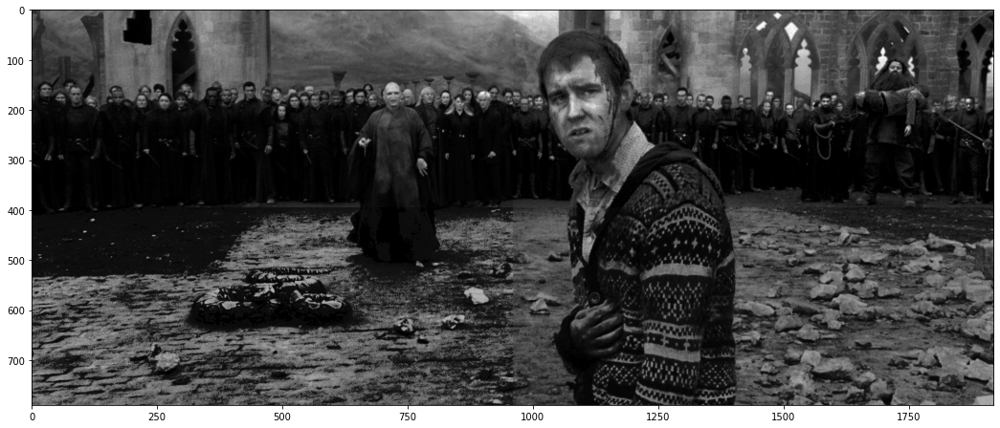

In [23]:
fig = plt.figure(figsize=(40, 35))

nev1=linContrastStretching(np.copy(nev1),0,255)
nev2=linContrastStretching(np.copy(nev2),0,255)
nev3=linContrastStretching(np.copy(nev3),0,255)

nev1=cv2.cvtColor(nev1,cv2.COLOR_BGR2GRAY)
nev2=cv2.cvtColor(nev2,cv2.COLOR_BGR2GRAY)
nev3=cv2.cvtColor(nev3,cv2.COLOR_BGR2GRAY)
nev4=cv2.cvtColor(nev4,cv2.COLOR_BGR2GRAY)


nev1 = gamma_transform(np.copy(nev1),1.1)

nev4=gamma_transform(np.copy(nev4),2.2)

nev2=bitQuantizeImage(np.copy(nev2),7)
nev2=histMatch(np.copy(nev2),np.copy(nev4))
nev2=gamma_transform(np.copy(nev2),0.8)

nev3,junk=histEqualization(np.copy(nev3))
nev3=gamma_transform(np.copy(nev3),3.2)

final=cv2.vconcat([cv2.hconcat([nev1,nev3]),cv2.hconcat([nev2,nev4])])

fig.add_subplot(4,2,2)
plt.imshow(final,cmap='gray')